In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%pylab inline
import seaborn as sns
import networkx as nx

Populating the interactive namespace from numpy and matplotlib


In [122]:
l =  ['7','LZ', 'DZ', '5', '8', '1', '3','6', '4', '2', '0']
lmap = {j:i for i,j in enumerate(l)}
palt = {str(i):j for i,j in enumerate(sns.color_palette('bright',10))}
palt['LZ'] = palt[str(9)]
palt['DZ'] = 'darkgreen'


In [123]:
'''
this code samples the GC CNs and projects them into barycentric coordinates
'''
w = pd.read_pickle('cn_windows_50thru1000/100_windows')
wgc  = w.loc[w.loc[:,['LZ','DZ','5']].sum(axis=1)>90,:]
idx = wgc.index.values
x = wgc.loc[:,['LZ','DZ','5']]
proj = np.array([[0,0],[np.cos(np.pi/3),np.sin(np.pi/3)], [1,0]])
coords = np.dot(x/100,proj)

(-0.06058563574617806,
 1.060970809882427,
 -0.05576865241004837,
 0.919550288036733)

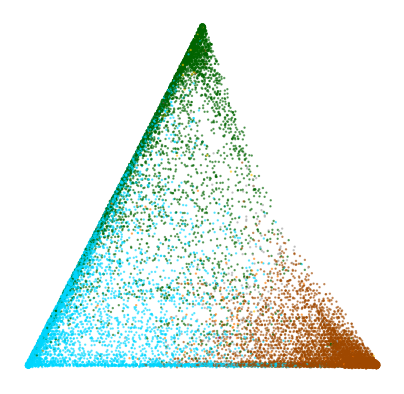

In [124]:
figsize(7,7)
jit = .002
cols = [palt[a] for a in wgc['NEIGH_newGC']]
plt.scatter(coords[:,0]+jit*np.random.randn(len(coords)),coords[:,1]+jit*np.random.randn(len(coords)),s = 2,alpha = .5, c = cols)
plt.axis('off')

(-0.05820032306440137,
 1.0581554250326843,
 -0.05340513679119068,
 0.91985461384739)

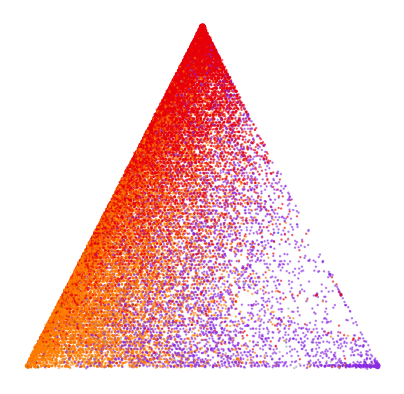

In [10]:
'''
this code does the same with the T cell zone CNs
'''
wgc  = w.loc[w.loc[:,['1','3','4']].sum(axis=1)>90,:].sample(n = 80000)
idx = wgc.index.values
x = wgc.loc[:,['1','3','4']]
proj = np.array([[0,0],[np.cos(np.pi/3),np.sin(np.pi/3)], [1,0]])
coords = np.dot(x/100,proj)

figsize(7,7)
jit = .002
cols = [palt[a] for a in wgc['NEIGH_newGC']]
plt.scatter(coords[:,0]+jit*np.random.randn(len(coords)),coords[:,1]+jit*np.random.randn(len(coords)),s = 2,alpha = .5, c = cols)
plt.axis('off')

In [15]:
'''
this is the code that finds the minimal combination of CNs
required to make up a threshold percentage of assignments in a window
combinations are stored as a sorted tuple
'''
def get_thresh_simps(x,thresh):
    sorts = np.argsort(-x, axis = 1)
    x_sorted = -np.sort(-x, axis = 1)
    cumsums = np.cumsum(x_sorted,axis = 1)
    thresh_simps = pd.Series([tuple(sorted(sorts[i,:(1+j)])) for i,j in enumerate(np.argmax(cumsums>thresh,axis = 1))])
    return thresh_simps

In [16]:
w = pd.read_pickle('cn_windows_50thru1000/100_windows')
x = w.loc[:,l].values/100

In [34]:
w['combination'] = [tuple(l[a] for a in s) for s in simps]

In [37]:
w.to_pickle('windows100_with_combinations')

In [17]:
simps = get_thresh_simps(x,.9)
simp_freqs = simps.value_counts(normalize = True)
simp_sums = np.cumsum(simp_freqs)

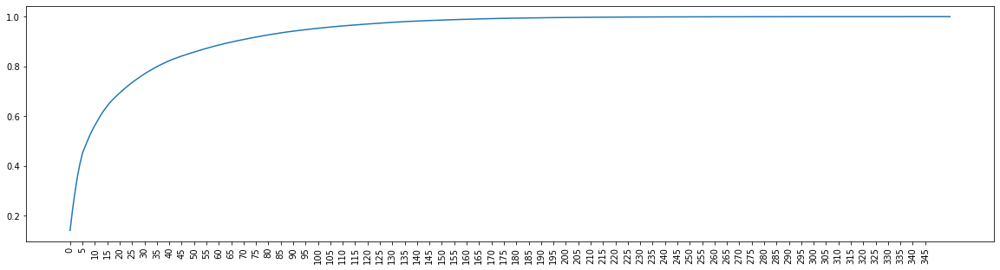

In [18]:
# this shows what proportion (y) of the total cells are assigned to the top x combinations
figsize(20,5)
plt.plot(simp_sums.values)
plt.xticks(range(0,350,5),range(0,350,5),rotation = 90,fontsize = 10);

In [19]:
import sys
sys.path.append('../cellhier/')
from cellhier.general import catplot, conplot

The following plots show that we start missing out some important bits when we cut the number of combinations we visualise

tonsil9338


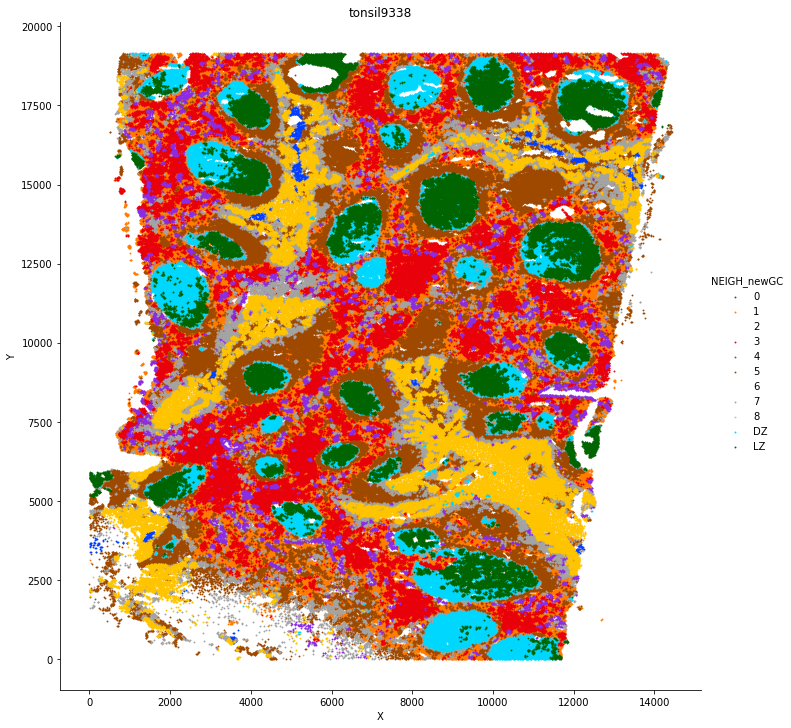

LN


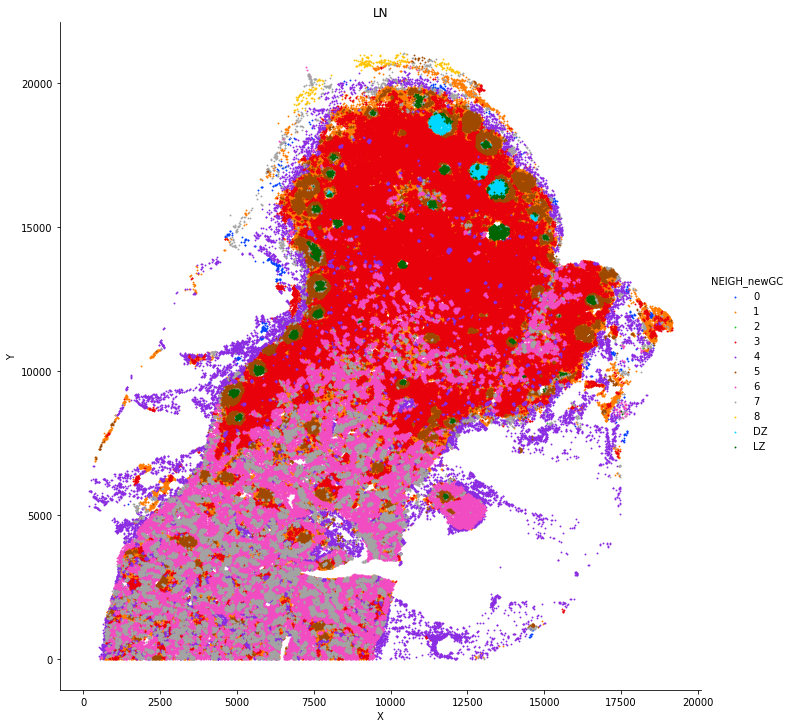

spleen


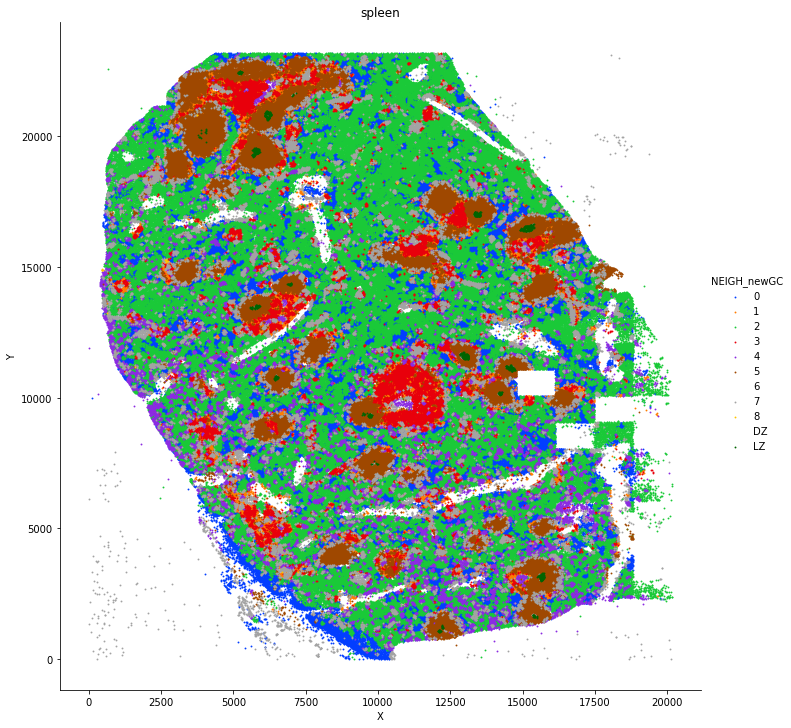

tonsil8953


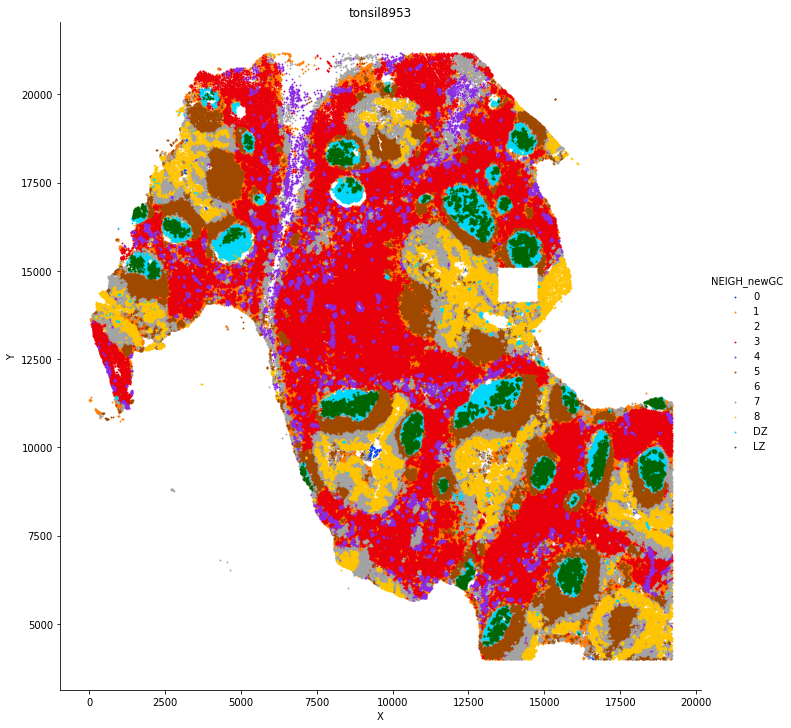

In [20]:
selected_cells = simps[simps.isin(simp_sums[simp_sums<=.99].index.values)]
catplot(w.loc[selected_cells.index.values],hue = 'NEIGH_newGC',palette = palt,figsize =10)

tonsil9338


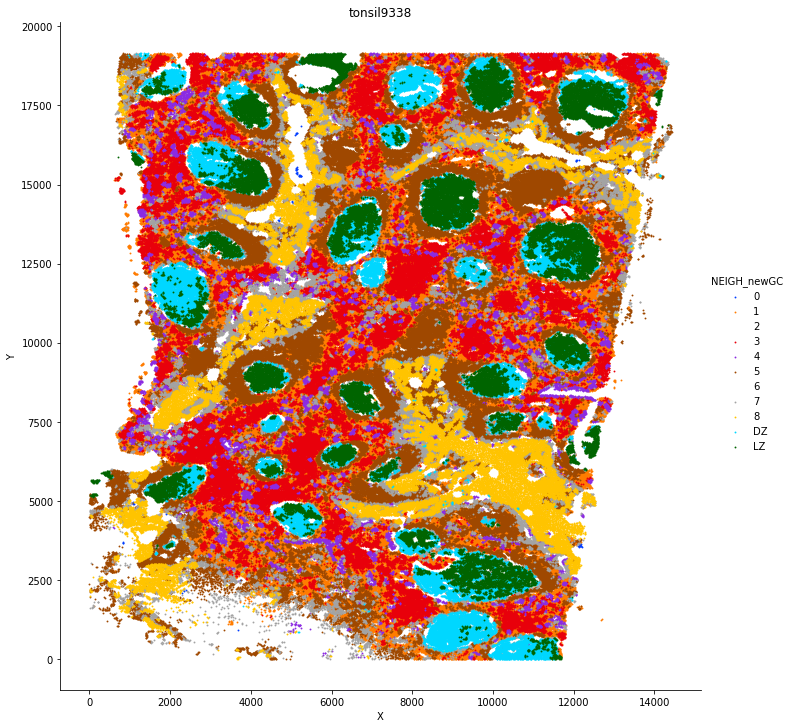

LN


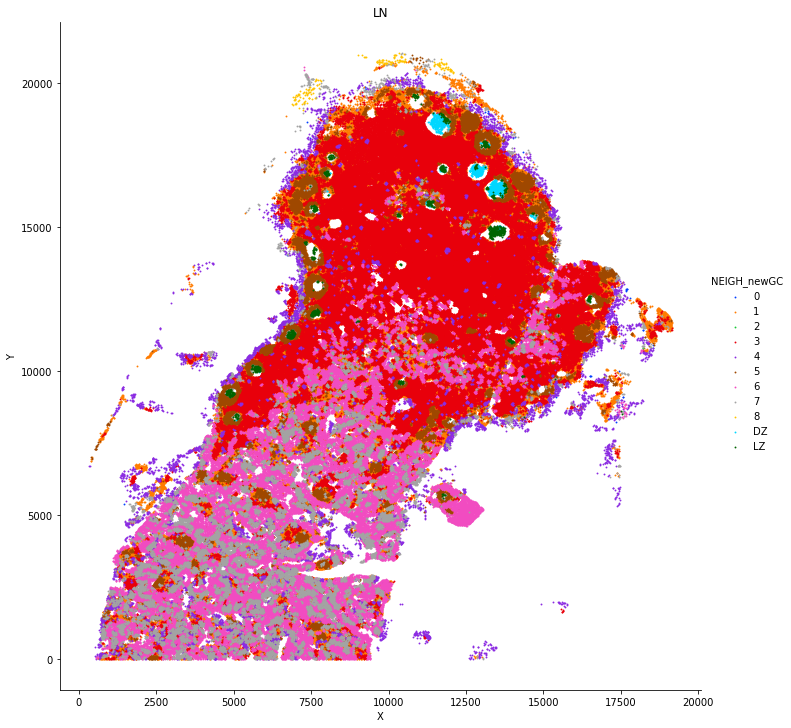

spleen


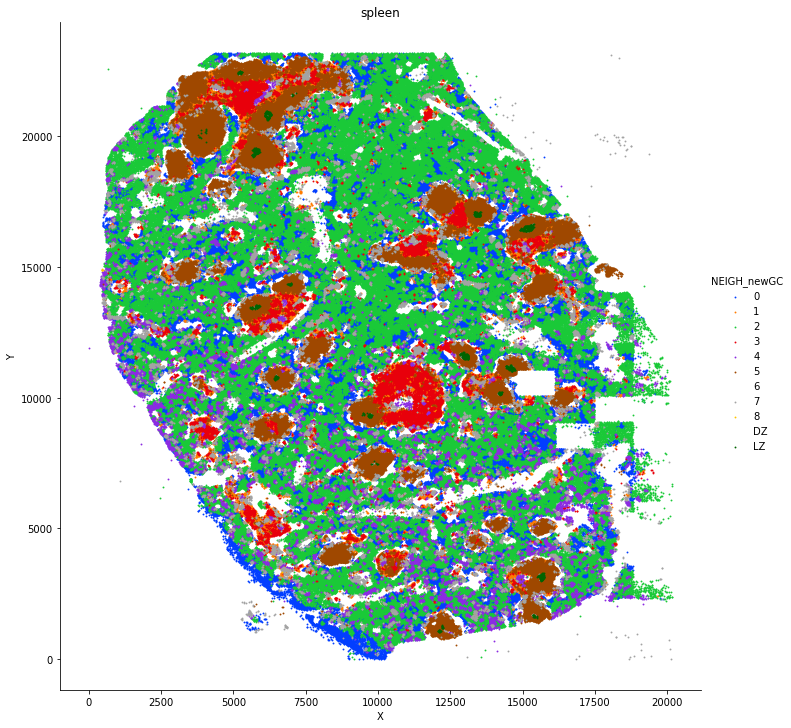

tonsil8953


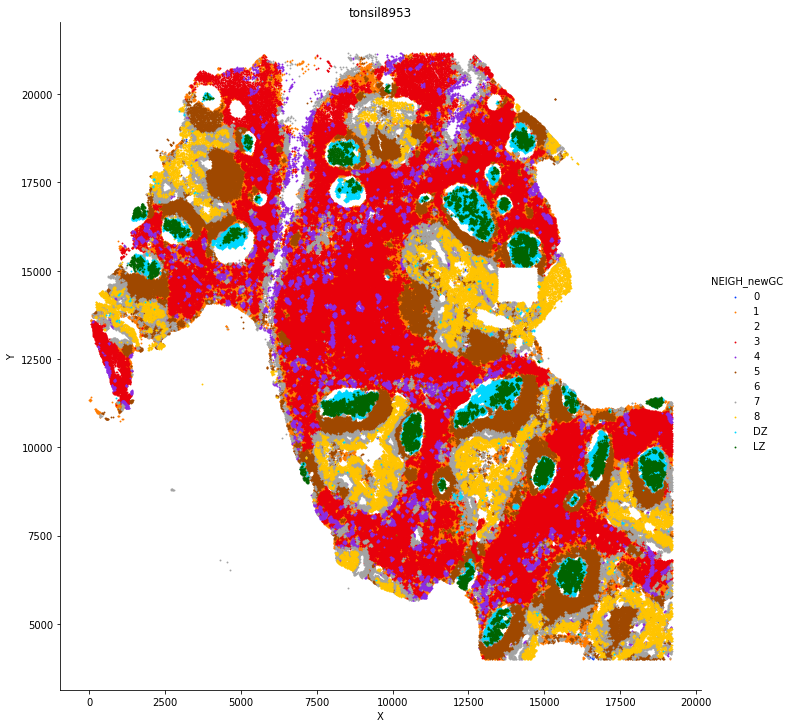

In [21]:
selected_cells = simps[simps.isin(simp_sums[simp_sums<=.9].index.values)]
catplot(w.loc[selected_cells.index.values],hue = 'NEIGH_newGC',palette = palt,figsize =10)

tonsil9338


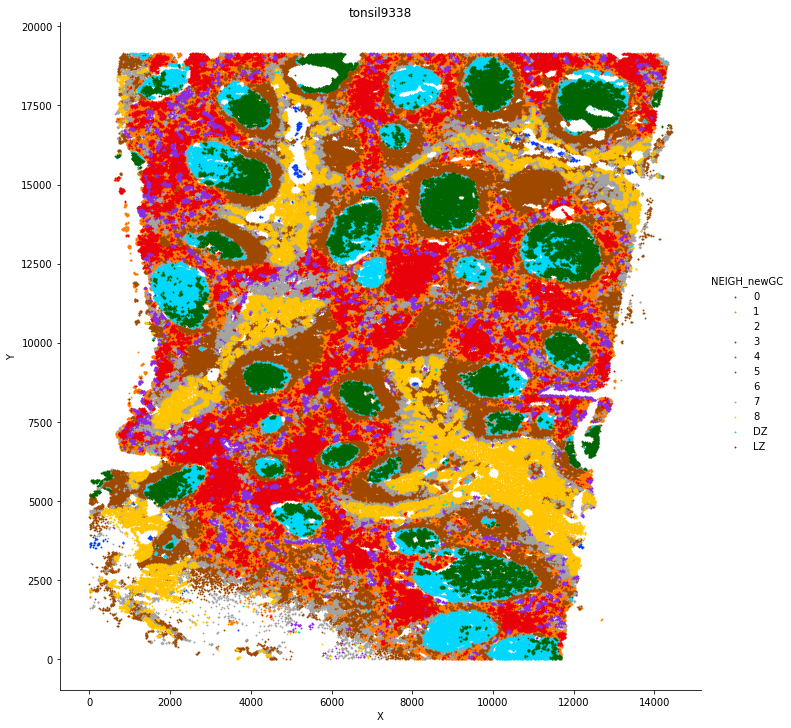

LN


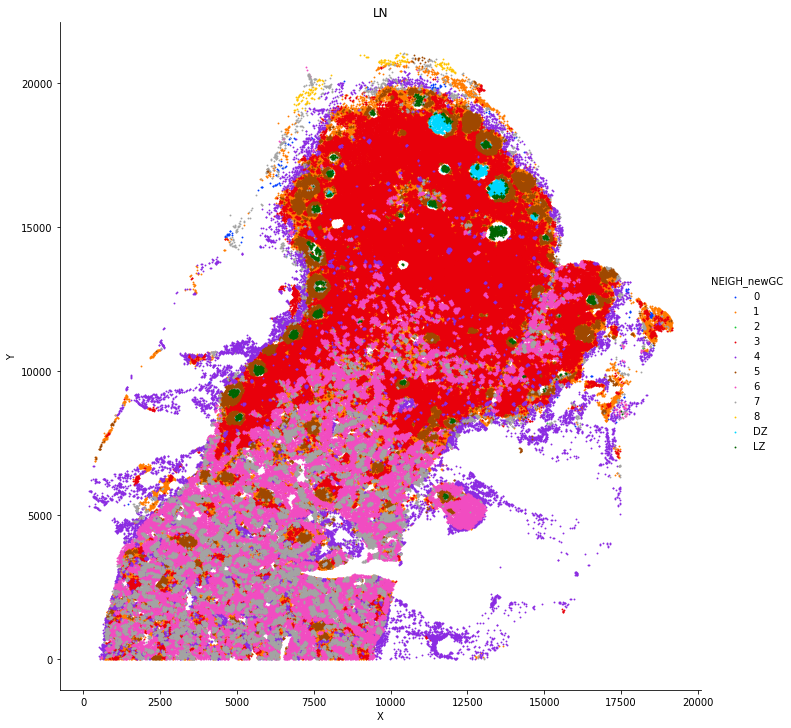

spleen


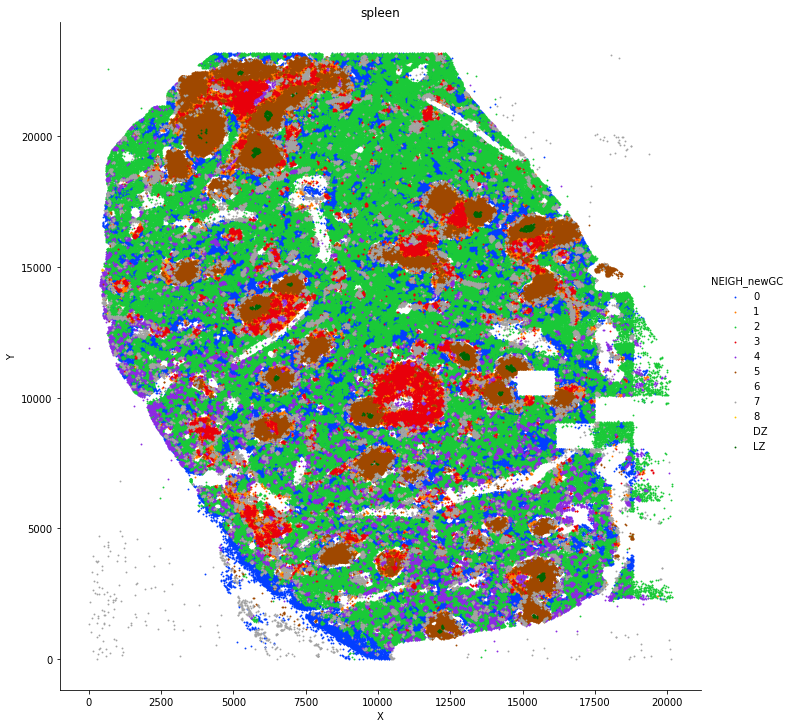

tonsil8953


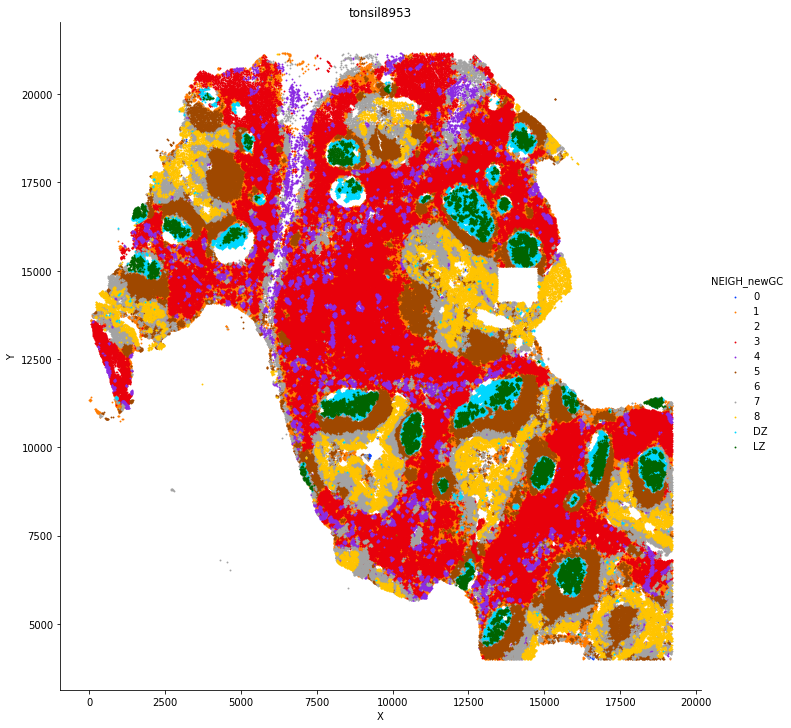

In [22]:
selected_cells = simps[simps.isin(simp_sums[simp_sums<=.95].index.values)]
catplot(w.loc[selected_cells.index.values],hue = 'NEIGH_newGC',palette = palt,figsize =10)

We appear to gain some systematic bias by taking only those simplices up to .9 in sum. .95 seems a little better, but the tradeoff is between what the graph looks like at .95 and .99.

tonsil9338


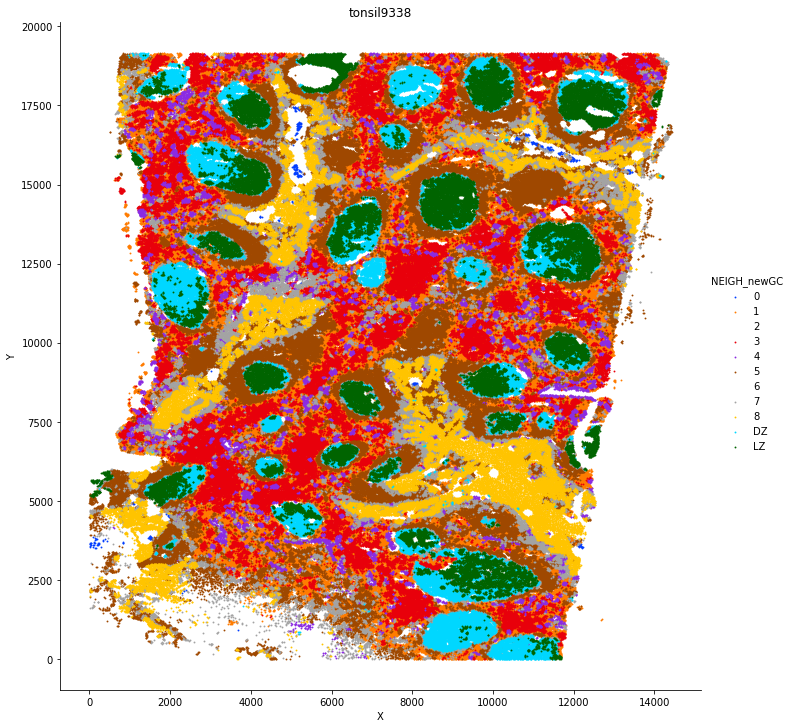

LN


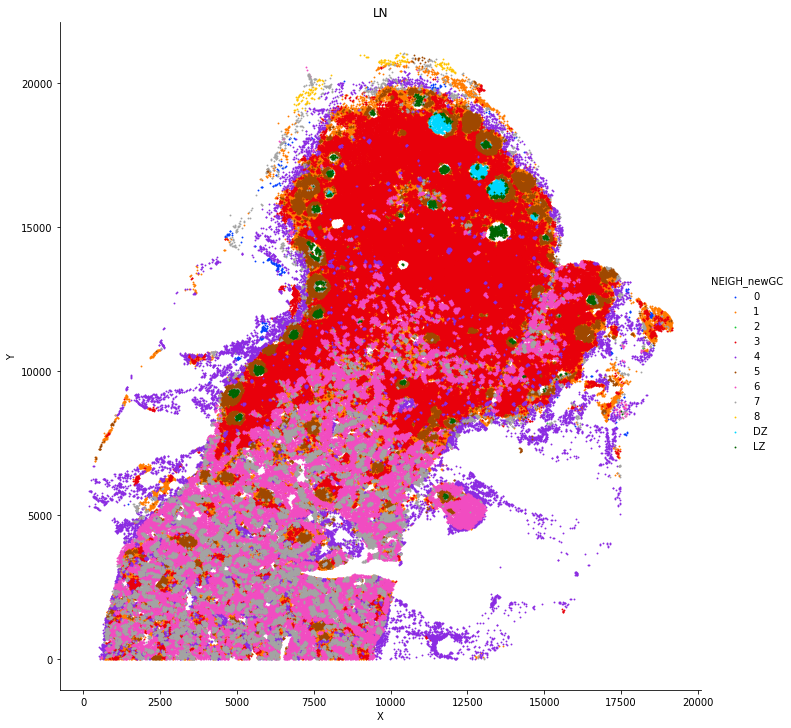

spleen


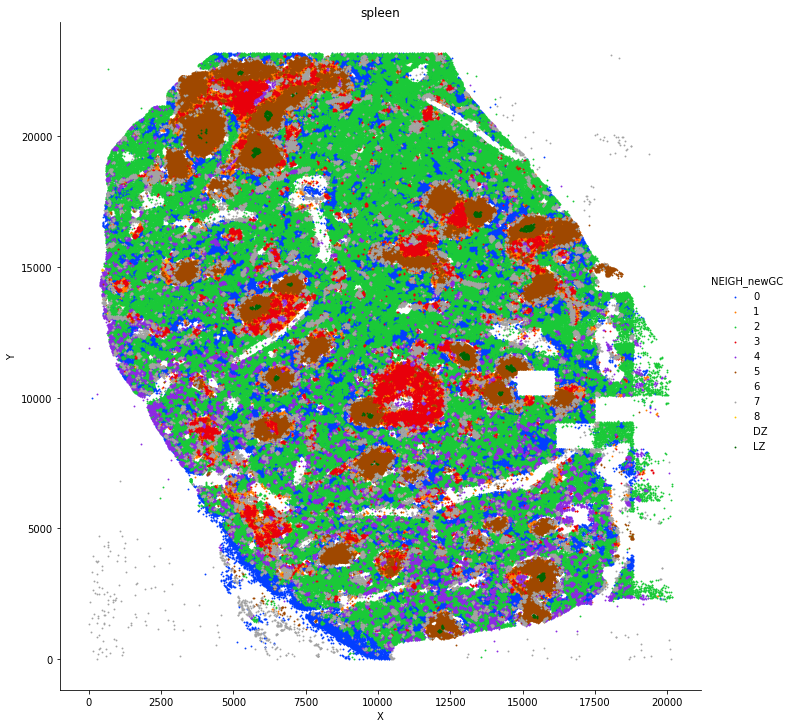

tonsil8953


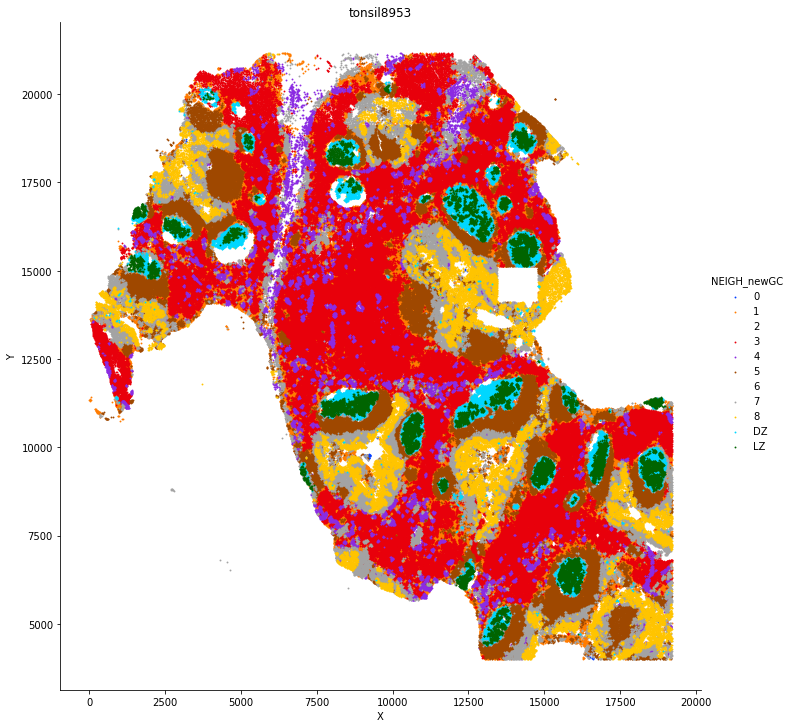

In [23]:
selected_cells = simps[simps.isin(simp_sums[simp_freqs>=.001].index.values)]
catplot(w.loc[selected_cells.index.values],hue = 'NEIGH_newGC',palette = palt,figsize =10)

In [127]:
g = nx.DiGraph()
thresh_cumulative = .99
thresh_freq = .001
#selected_simps = simp_sums[simp_sums<=thresh_cumulative].index.values
selected_simps = simp_freqs[simp_freqs>=thresh_freq].index.values

In [138]:
'''
this builds the graph for the CN combination map
'''
for e0 in selected_simps:
    for e1 in selected_simps:
        if (set(list(e0))<set(list(e1))) and (len(e1) == len(e0)+1):
            g.add_edge(e0,e1)

In [151]:
tops = simp_freqs[simp_freqs>=thresh_freq].sort_values(ascending = False).index.values.tolist()[:20]

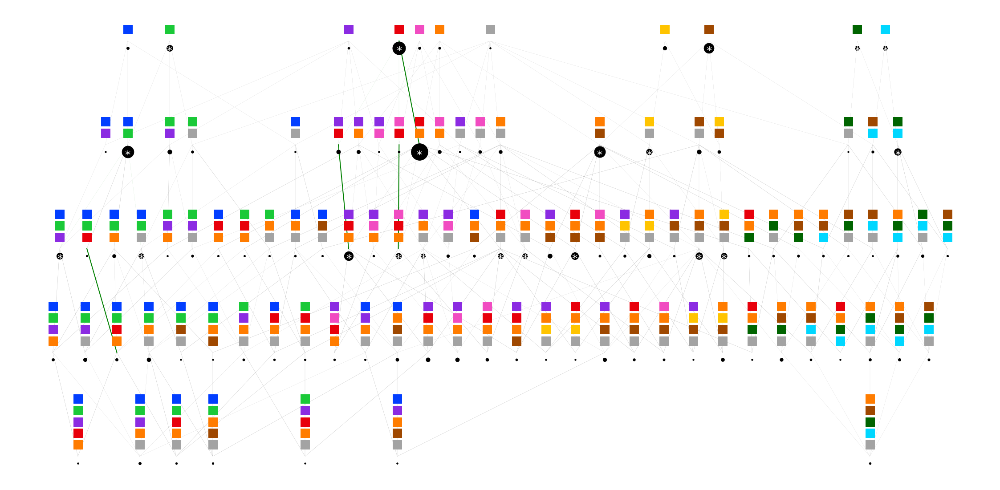

In [187]:
'''
this plots the CN combination map
'''
draw = g
pos = nx.drawing.nx_pydot.graphviz_layout(draw, prog='dot')


figsize(40,20)
for n in draw.nodes():
    col = 'black'
    if len(draw.in_edges(n))<len(n):
        col = 'black'
    plt.scatter(pos[n][0],pos[n][1]-5, s = simp_freqs[n]*10000, c = col, zorder = -1)
    if n in tops:
        plt.text(pos[n][0],pos[n][1]-7, '*', fontsize = 25, color = 'white', ha = 'center', va = 'center',zorder = 20)
    delta = 8
    #plot_sim((pos[n][0]+delta, pos[n][1]+delta),n, scale = 20,s = 200,text = True,fontsize = 15)
    plt.scatter([pos[n][0]]*len(n),[pos[n][1]+delta*(i+1) for i in range(len(n))],c = [palt[l[i]] for i in n] ,marker = 's', zorder = 5,s = 400)
    
        
j = 0
for e0,e1 in draw.edges():
    weight = 0.2
    alpha = .3
    if len(draw.in_edges(e1))<len(e1):
        color = 'black'
        lw =1
        weight = 0.4
        
#     if (e0,e1) in set(draw.out_edges(tuple(sorted([lmap['3'],lmap['1']])))):
#         j+=1
#         print(j)
#         color = 'green'
#         weight = 2
#         alpha = 1
        
    if (lmap['3'] in e0) and (lmap['1'] not in e0) and (lmap['1'] in e1):
        color = 'green'
        weight = 2
        alpha = 1

    plt.plot([pos[e0][0], pos[e1][0]],[pos[e0][1], pos[e1][1]], color = color, linewidth = weight,alpha = alpha,zorder = -10)

plt.axis('off')
plt.savefig('CNM.pdf')
plt.show()
